# Time Scale Modification

In [4]:
%matplotlib inline

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import librosa as lb
import IPython.display as ipd
from scipy.signal import medfilt
import scipy

### Approach 1: Overlap-Add (OLA) [20 points]

The first approach you will implement is the overlap-add (OLA) method.  In this section, you should do the following:
- implement a function called tsm_overlap_add which takes three arguments: an input signal x, the time stretch factor alpha, and the frame length L.  It should return the time-stretched signal.  Your function should use default values of alpha=1 and L=220, and it should use a synthesis hop size that is half the value of L.
- apply your function to time stretch the beatboxing audio sample (with 22050 Hz sampling rate) by a factor of 1.25 (slowed down) and 0.75 (sped up).  Embed the resulting audio files in the notebook.
- apply your function to time stretch the choir audio sample by a factor of 1.25 (slowed down) and 0.75 (sped up).  Embed the resulting audio file in the notebook.
- Comment on the quality of the OLA algorithm when applied to the beatbox and choir audio samples.

In [6]:
def tsm_overlap_add(x, alpha = 1.0, L = 220):
    '''
    Time stretches the input signal using the overlap-add method.  Uses an synthesis hop size that is half the
    value of L.
    
    Inputs
    x: the input signal
    alpha: the time stretch factor, which is defined as the ratio of the synthesis hop size to the analysis hop size
    L: the length of each analysis frame in samples
    
    Returns the time-stretched signal y.
    '''
    assert(L % 2 == 0), "Frame length must be even."
    Hs = L // 2
    
    # compute analysis frames
    Ha = int(np.round(Hs/alpha))
    numFrames = (len(x) - L) // Ha + 1
    analysisFrames = np.zeros((L, numFrames))
    for i in range(numFrames):
        offset = i * Ha
        analysisFrames[:, i] = x[offset: offset + L]
    
    # reconstruction
    synthesisFrames = analysisFrames * hann_window(L).reshape((-1,1)) # use broadcasting
    y = np.zeros(Hs * (numFrames-1) + L)
    for i in range(numFrames):
        offset = i * Hs
        y[offset:offset+L] += synthesisFrames[:,i]
    
    return y

In [7]:
def hann_window(L):
    w = .5 * (1 - np.cos(2*np.pi * np.arange(L)/ L))
    return w

In [8]:
beatbox_orig, sr = lb.core.load('beatbox.wav')
beatbox_slow = tsm_overlap_add(beatbox_orig, 1.25)
beatbox_fast = tsm_overlap_add(beatbox_orig, .75)

In [9]:
ipd.Audio(beatbox_orig, rate=sr)

In [10]:
ipd.Audio(beatbox_slow, rate=sr)

In [11]:
ipd.Audio(beatbox_fast, rate=sr)

In [12]:
len(beatbox_fast)

165000

In [13]:
choir_orig, sr = lb.core.load('choir.wav')
choir_slow = tsm_overlap_add(choir_orig, 2)
choir_fast = tsm_overlap_add(choir_orig, 0.75)

In [14]:
ipd.Audio(choir_orig, rate=sr)

In [15]:
ipd.Audio(choir_slow, rate=sr)

In [16]:
ipd.Audio(choir_fast, rate=sr)

OLA works really well for beatboxing, but is terrible with the choir singing.

### Approach 2: Phase Vocoder [45 points]

The second approach you will implement is the phase vocoder method.  In this section, you should do the following:
- implement a function called tsm_phase_vocoder which takes three arguments: an input signal x, the time stretch factor alpha, the frame length L, and the sample rate sr.  It should return the time-stretched signal.  Your function should use default values of alpha=1, L=2048, and sr=22050, and it should use a synthesis hop size that is one-fourth the value of L.  For the STFT, you may use the librosa stft function with FFT size 2048.  However, you should implement the istft function yourself (do *not* use the librosa istft function or look at its source code).
- apply your function to time stretch the beatboxing audio sample (with 22050 Hz sampling rate) by a factor of 1.25 (slowed down) and 0.75 (sped up).  Embed the resulting audio files in the notebook.
- apply your function to time stretch the choir audio sample by a factor of 1.25 (slowed down) and 0.75 (sped up).  Embed the resulting audio files in the notebook.
- Comment on the quality of the phase vocoder algorithm when applied to the beatbox and choir audio samples.

In [17]:
def tsm_phase_vocoder(x, alpha = 1.0, L = 2048, sr = 22050):
    '''
    Time stretches the input signal using the phase vocoder method.  Uses a synthesis hop size that is one-fourth the
    value of L.
    
    Inputs
    x: the input signal
    alpha: the time stretch factor, which is defined as the ratio of the synthesis hop size to the analysis hop size
    L: the length of each analysis frame in samples
    sr: sampling rate
    
    Returns the time-stretched signal y.
    '''
    assert(L % 4 == 0), "Frame length must be divisible by four."
    Hs = L // 4
    
    # compute STFT
    Ha = int(np.round(Hs/alpha))
    window = hann_window(L)
    X = lb.core.stft(x, n_fft = L, hop_length = Ha, window=window, center=False)
    
    # compute modified STFT
    w_if = estimateIF(X, sr, Ha)
    phase_mod = np.zeros(X.shape)
    phase_mod[:,0] = np.angle(X[:,0])
    for i in range(1, phase_mod.shape[1]):
        phase_mod[:,i] = phase_mod[:,i-1] + w_if[:,i-1] * Hs / sr
    Xmod = np.abs(X) * np.exp(1j * phase_mod)
    
    # signal reconstruction
    y = invert_stft(Xmod, Hs, window)
    #y = lb.core.istft(Xmod, hop_length=Hs, center=False)
    
    return y

In [18]:
def estimateIF(S, sr, hop_samples):
    '''
    Estimates the instantaneous frequencies in a STFT matrix.
    
    Inputs
    S: the STFT matrix, should only contain the lower half of the frequency bins
    sr: sampling rate
    hop_samples: the hop size of the STFT analysis in samples
    
    Returns a matrix containing the estimated instantaneous frequency at each time-frequency bin.
    This matrix should contain one less column than S.
    '''
    hop_sec = hop_samples / sr
    fft_size = (S.shape[0] - 1) * 2
    w_nom = np.arange(S.shape[0]) * sr / fft_size * 2 * np.pi
    w_nom = w_nom.reshape((-1,1))    
    unwrapped = np.angle(S[:,1:]) - np.angle(S[:,0:-1]) - w_nom * hop_sec
    wrapped = (unwrapped + np.pi) % (2 * np.pi) - np.pi
    w_if = w_nom + wrapped / hop_sec
    return w_if

In [19]:
def invert_stft(S, hop_length, window):
    '''
    Reconstruct a signal from a modified STFT matrix.
    
    Inputs
    S: modified STFT matrix
    hop_length: the synthesis hop size in samples
    window: an array specifying the window used for FFT analysis
    
    Returns a time-domain signal y whose STFT is closest to S in squared error distance.
    '''
    
    L = len(window)
    
    # construct full stft matrix
    fft_size = (S.shape[0] - 1) * 2
    Sfull = np.zeros((fft_size, S.shape[1]), dtype=np.complex64)
    Sfull[0:S.shape[0],:] = S
    Sfull[S.shape[0]:,:] = np.conj(np.flipud(S[1:fft_size//2,:]))
    
    # compute inverse FFTs
    frames = np.zeros_like(Sfull)
    for i in range(frames.shape[1]):
        frames[:,i] = np.fft.ifft(Sfull[:,i])
    frames = np.real(frames) # remove imaginary components due to numerical roundoff
    
    # synthesis frames
    num = window.reshape((-1,1))
    den = calc_sum_squared_window(window, hop_length)
    #den = np.square(window) + np.square(np.roll(window, hop_length))
    frames = frames * window.reshape((-1,1)) / den.reshape((-1,1))
    #frames = frames * window.reshape((-1,1))
    
    # reconstruction
    y = np.zeros(hop_length*(frames.shape[1]-1) + L)
    for i in range(frames.shape[1]):
        offset = i * hop_length
        y[offset:offset+L] += frames[:,i]
    
    return y

In [20]:
def calc_sum_squared_window(window, hop_length):
    '''
    Calculates the denominator term for computing synthesis frames.
    
    Inputs
    window: array specifying the window used in FFT analysis
    hop_length: the synthesis hop size in samples
    
    Returns an array specifying the normalization factor.
    '''
    assert (len(window) % hop_length == 0), "Hop length does not divide the window evenly."
    
    numShifts = len(window) // hop_length
    den = np.zeros_like(window)
    for i in range(numShifts):
        den += np.roll(np.square(window), i*hop_length)
        
    return den

In [21]:
beatbox_slow = tsm_phase_vocoder(beatbox_orig, 1.25)
beatbox_fast = tsm_phase_vocoder(beatbox_orig, .75)

In [22]:
ipd.Audio(beatbox_slow, rate=sr)

In [23]:
ipd.Audio(beatbox_fast, rate=sr)

In [24]:
choir_slow = tsm_phase_vocoder(choir_orig, 1.25)
choir_fast = tsm_phase_vocoder(choir_orig, 0.75)

In [25]:
ipd.Audio(choir_slow, rate=sr)

In [26]:
ipd.Audio(choir_fast, rate=sr)

The phase vocoder works okay with the beatboxing, but the transients have been smeared so the attacks are less crisp.  The vocoder works really well with the choir singing.

### Harmonic Percussive Separation [15 points]

In preparation for implementing the third time scale modification approach, you will implement harmonic percussive separation.  In this section, you should do the following:
- implement a function called harmonic_percussive_separation which takes five arguments: an input signal x, sample rate sr, FFT size fft_size, hop size hop_length, harmonic median filter half-length lh, and percussive median filter half-length lp.  It should return four outputs: the two time-domain signals xh and xp corresponding to the harmonic and percussive components, and the two corresponding modified STFTs Xh and Xp.  Your function should use default values sr=22050, fft_size=2048, hop_length=512, lh=6, and lp=6.  You may use the librosa stft function, but you should implement the rest yourself.  You should *not* use the librosa hpss function or look at its source code.  Make sure to reuse your istft function from above!
- superimpose the choir and beatboxing audio recordings together by taking the average of their time domain signals.  Process the mixture with your algorithm to estimate the harmonic and percussive components, and embed the two resulting audio recordings in the notebook.
- Compute the log-magnitude spectrogram of the estimated xh and xp signals, and visualize a short section of both specgtrograms.  Include the images in your notebook and comment on what you see.

In [27]:
def harmonic_percussive_separation(x, sr=22050, fft_size = 2048, hop_length=512, lh=6, lp=6):
    
    window = hann_window(fft_size)
    X = lb.core.stft(x, n_fft=fft_size, hop_length=512, window=window, center=False)
    Y = np.abs(X)
    Yh = medfilt(Y, (1, 2*lh+1))
    Yp = medfilt(Y, (2*lp+1, 1))
    Mh = (Yh > Yp)
    Mp = np.logical_not(Mh)
    Xh = X * Mh
    Xp = X * Mp
    xh = invert_stft(Xh, hop_length, window)
    xp = invert_stft(Xp, hop_length, window)
    
    return xh, xp, Xh, Xp

In [28]:
def mix_recordings(x1, x2):
    min_length = min(len(x1), len(x2))
    y = .5 * (x1[0:min_length] + x2[0:min_length])
    return y

In [29]:
mixed = mix_recordings(choir_orig, beatbox_orig)

In [30]:
xh, xp, Xh, Xp = harmonic_percussive_separation(mixed, lh=6, lp=6)

In [31]:
ipd.Audio(xh, rate=sr)

In [32]:
ipd.Audio(xp, rate=sr)

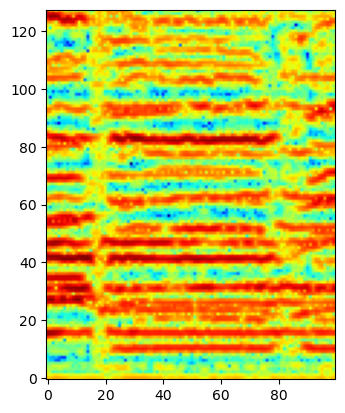

In [33]:
spec_h = np.log(np.abs(lb.core.stft(xh)))
plt.imshow(spec_h[0:128,50:150], origin='lower', cmap='jet')
plt.show()

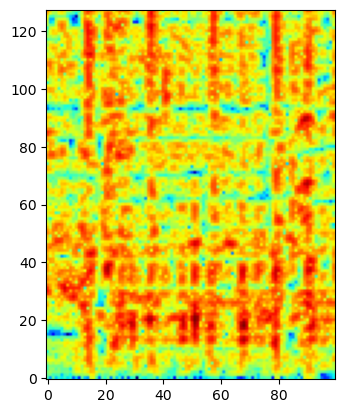

In [34]:
spec_p = np.log(np.abs(lb.core.stft(xp)))
plt.imshow(spec_p[0:128,50:150], origin='lower', cmap='jet')
plt.show()

We can see that the spectrogram of xh has primarily horizontal bands corresponding to frequency harmonics.  The spectrogram of xp has primarily vertical bands corresponding to transients.

### Approach 3: Hybrid Method [5 points]

The third approach you will implement is the hybrid method that combines both the overlap-add and phase vocoder methods. In this section, you should do the following:
- implement a function called tsm_hybrid which takes five arguments: an input signal x, time stretch factor alpha, and sample rate sr.  It should return the time-stretched signal y.  Your function should assume default values of alpha=1, sr=22050.  You should call the functions you implemented in earlier sections and use the corresponding default values.
- apply your function to time stretch the beatboxing audio sample by a factor of 1.25 (slowed down) and 0.75 (sped up). Embed the resulting audio files in the notebook.
- apply your function to time stretch the choir audio sample by a factor of 1.25 (slowed down) and 0.75 (sped up). Embed the resulting audio files in the notebook.
- Comment on the quality of the hybrid algorithm when applied to the beatbox and choir audio samples.

In [35]:
def tsm_hybrid(x, alpha=1.0, sr=22050):
    '''
    Time stretches the input signal using a hybrid method that combines overlap-add and phase vocoding.
    
    Inputs
    x: the input signal
    alpha: the time stretch factor, which is defined as the ratio of the synthesis hop size to the analysis hop size
    sr: sampling rate
    
    Returns the time-stretched signal y.
    '''
    
    xh, xp, _, _ = harmonic_percussive_separation(x)
    xh_stretched = tsm_phase_vocoder(xh, alpha)
    xp_stretched = tsm_overlap_add(xp, alpha)
    y = mix_recordings(xh_stretched, xp_stretched)
    
    return y

In [36]:
beatbox_slow = tsm_hybrid(beatbox_orig, 1.25)
beatbox_fast = tsm_hybrid(beatbox_orig, .75)

In [37]:
ipd.Audio(beatbox_slow, rate=sr)

In [38]:
ipd.Audio(beatbox_fast, rate=sr)

In [39]:
choir_slow = tsm_hybrid(choir_orig, 1.25)
choir_fast = tsm_hybrid(choir_orig, .75)

In [40]:
ipd.Audio(choir_slow, rate=sr)

In [41]:
ipd.Audio(choir_fast, rate=sr)

Works well on both audio samples!

### Make something cool! [5 points]

Now use the functions you've implemented above to create a cool 10-15 second audio sample of any music you like.  Feel free to time stretch, pitch shift, and mix audio recordings to create something original.  You should include the following:
- code for generating the audio sample
- the audio file embedded into the notebook
- a brief explanation of what you did

The most creative audio sample will be played in class!

In [42]:
def pitch_shift(x, alpha=1.0, sr=22050):
    '''
    Pitch shifts the input signal by the factor alpha.
    
    Inputs
    x: the input signal
    alpha: the pitch-shifting factor
    sr: sample rate
    
    Returns the pitch-shifted signal y.
    '''
    time_stretched = tsm_hybrid(x, alpha)
    pitch_shifted = lb.resample(time_stretched, orig_sr=int(sr*alpha), target_sr=sr)
    return pitch_shifted

In [43]:
choir_shifted_up = pitch_shift(choir_orig, 1.25)
choir_shifted_down = pitch_shift(choir_orig, .66)

In [44]:
ipd.Audio(choir_shifted_up, rate=sr)

In [45]:
ipd.Audio(choir_shifted_down, rate=sr)

In [46]:
beatbox_adjusted = tsm_hybrid(beatbox_orig, 1.17)[int(sr*0.4):]
choir_adjusted1 = tsm_hybrid(choir_orig[0:6*sr], .8)
choir_adjusted2 = tsm_hybrid(choir_orig[6*sr:], .91)
choir_adjusted = np.concatenate((choir_adjusted1, choir_adjusted2))
combined = mix_recordings(choir_adjusted, beatbox_adjusted)
ipd.Audio(combined, rate=sr)

A useful tool to have if you ever want to add some beatboxing!

In [47]:
combined_orig = mix_recordings(beatbox_orig, choir_orig)
ipd.Audio(combined_orig, rate=sr)